In [ ]:
! pip install -q kaggle
! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
! kaggle datasets download  'utkarshsaxenadn/landscape-recognition-image-dataset-12k-images'

Dataset URL: https://www.kaggle.com/datasets/utkarshsaxenadn/landscape-recognition-image-dataset-12k-images
License(s): CC0-1.0
 99% 493M/496M [00:06<00:00, 91.2MB/s]
100% 496M/496M [00:06<00:00, 81.7MB/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Show** Images


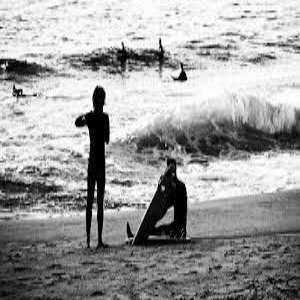

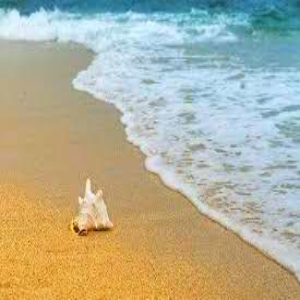

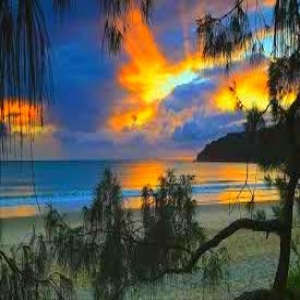

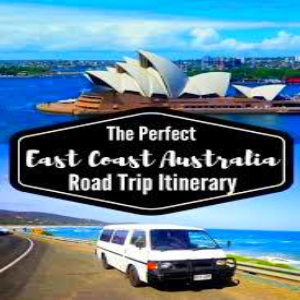

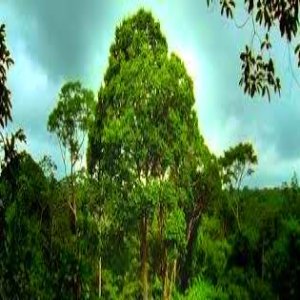

...

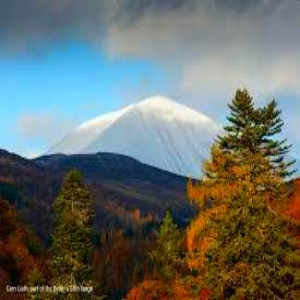

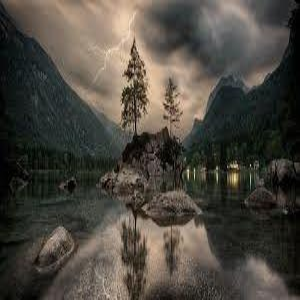

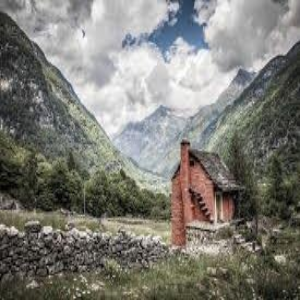

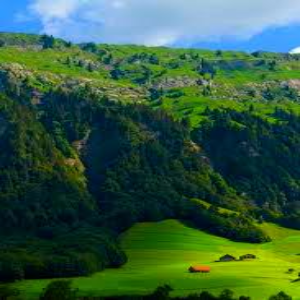

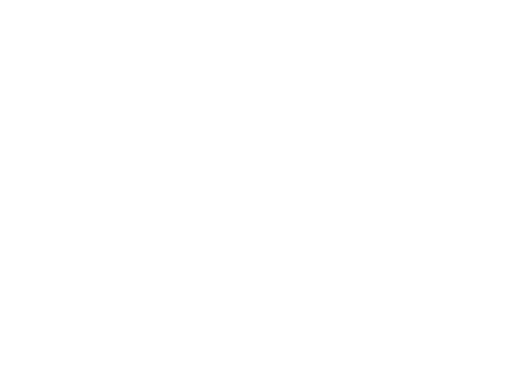

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

DATADIR = '/content/drive/MyDrive/Landscape Classification/Processed/Training'
CATEGORIES = ['Coast', 'Forest', 'Glacier', 'Mountain']
IMG_SIZE = (300, 300)  # set desired image size

for category in CATEGORIES:
    path = os.path.join(DATADIR, category) #create path to Birds and Drones
    x = 0
    for img in os.listdir(path):         #iterate over each image per category
        x += 1
        img_array = cv2.imread(os.path.join(path, img))    #convert to array
        img_array = cv2.resize(img_array, IMG_SIZE)  # resize the image
        cv2_imshow(img_array)
        plt.axis('off')

        if x == 4:
            break

Pre-processing , Feature extraction

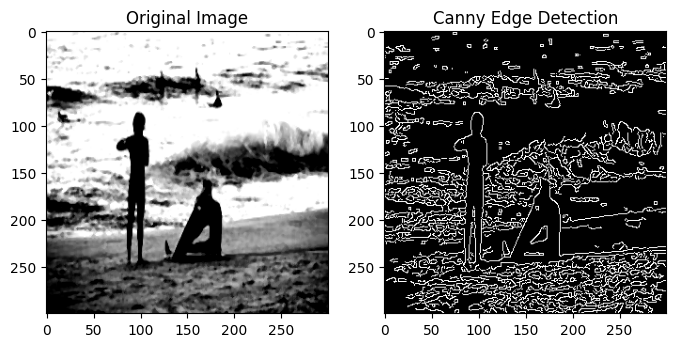

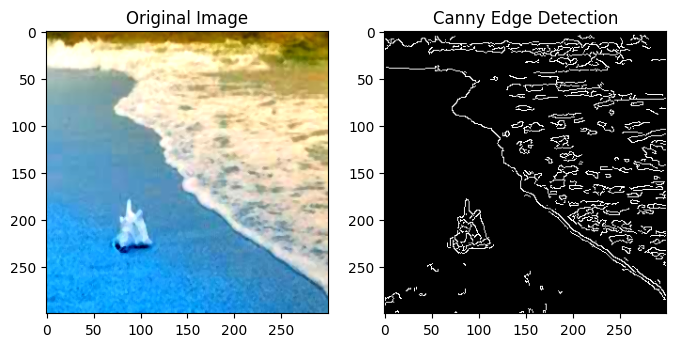

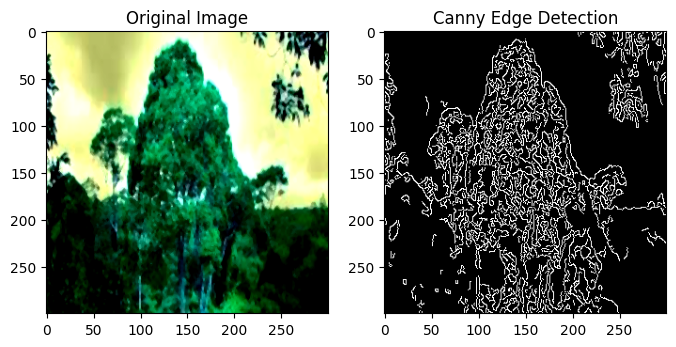

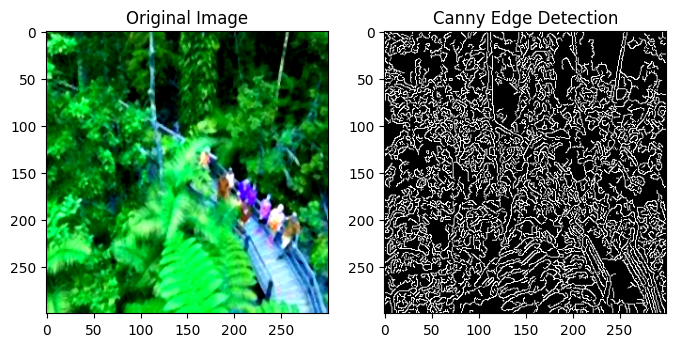

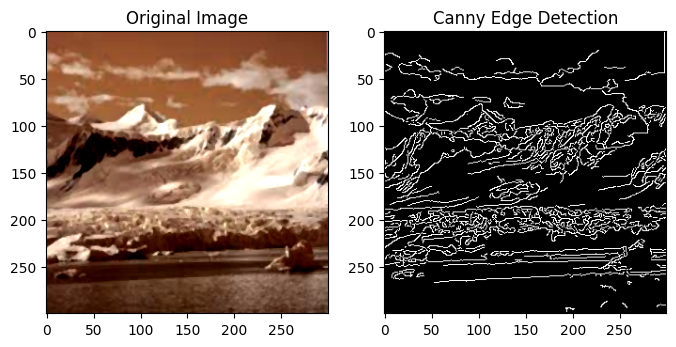

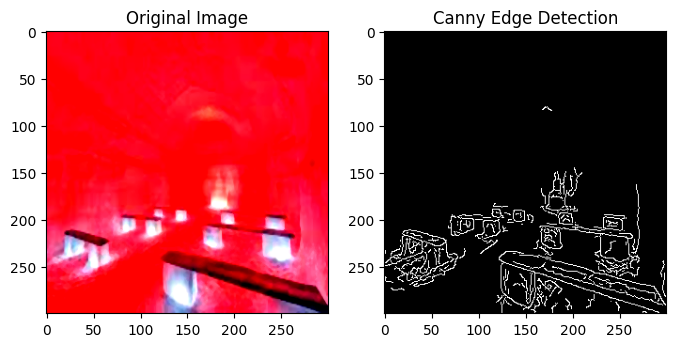

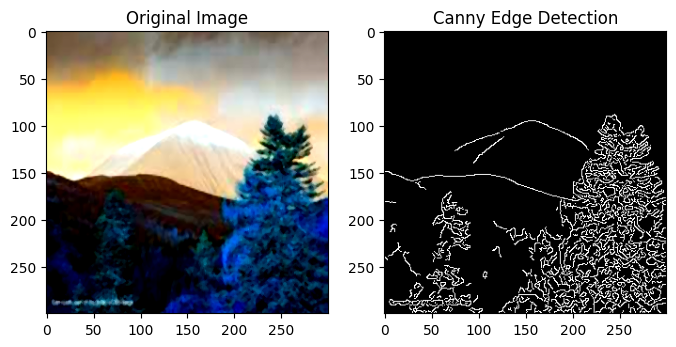

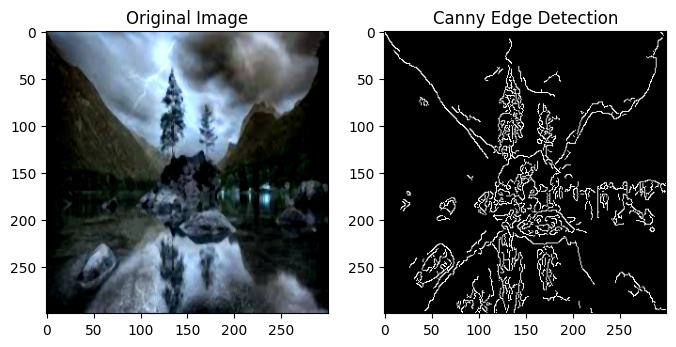

In [ ]:
import cv2
import os
import numpy as np
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt

DATADIR = '/content/drive/MyDrive/Landscape Classification/Processed/Training'
CATEGORIES = ['Coast', 'Forest', 'Glacier', 'Mountain']

IMG_SIZE = (300, 300)  # set desired image size

# Initialize variables
images = []
labels = []

for category in CATEGORIES:
    path = os.path.join(DATADIR, category)  # create path to category folder
    x = 0
    for img in os.listdir(path):
        img_path = os.path.join(path, img)
        img_array = cv2.imread(img_path)  # read image as numpy array

        # resize the image to desired size
        img_array = cv2.resize(img_array, IMG_SIZE)

        # apply a median blur filter to the image
        img_array = cv2.medianBlur(img_array, 3)

        # convert the array to PIL Image format
        pil_image = Image.fromarray(img_array)

        # enhance the contrast of the image
        enhancer = ImageEnhance.Contrast(pil_image)
        contrast_image = enhancer.enhance(1.5)  # increase contrast by a factor of 1.5

        # convert the enhanced image back to numpy array format
        img_array = cv2.cvtColor(np.array(contrast_image), cv2.COLOR_RGB2BGR)

        # perform canny edge detection
        edges = cv2.Canny(img_array, 100, 200)

        # plot the original and processed images side by side
        fig, axs = plt.subplots(1, 2, figsize=(8, 4))
        axs[0].imshow(cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB))
        axs[0].set_title('Original Image')
        axs[1].imshow(edges, cmap='gray')
        axs[1].set_title('Canny Edge Detection')
        plt.show()

        x += 1
        if x == 2:
            break

# Contrast

Showing images from category: Coast


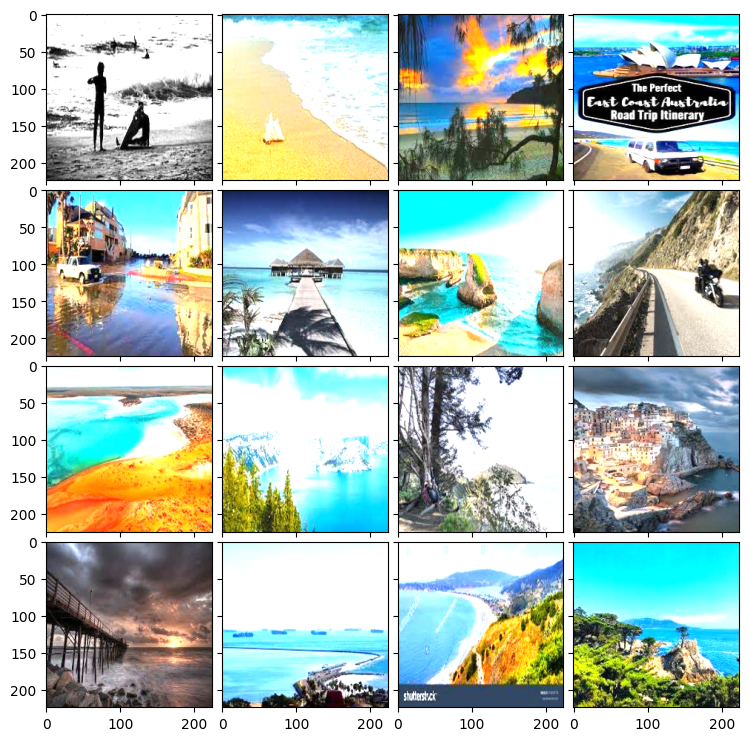

Showing images from category: Forest


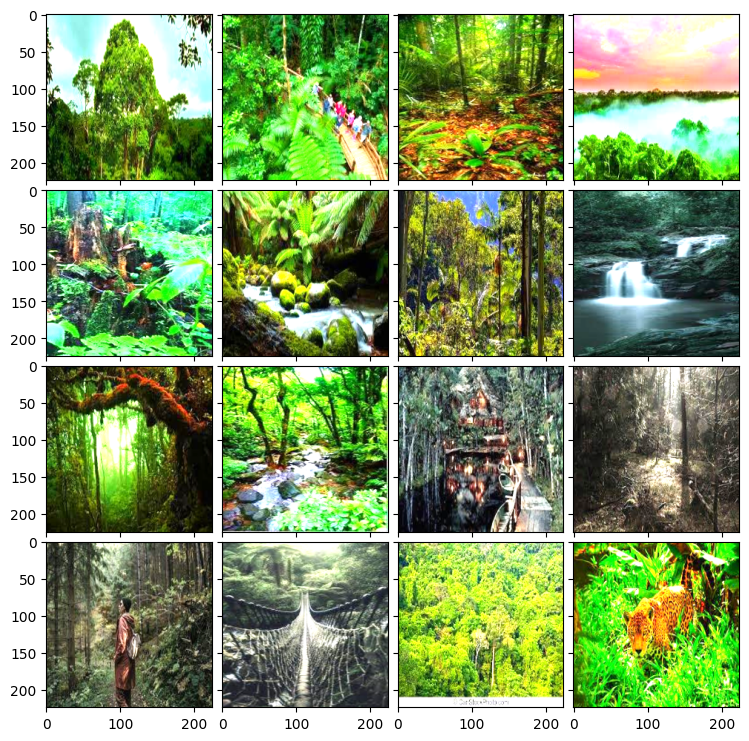

Showing images from category: Glacier


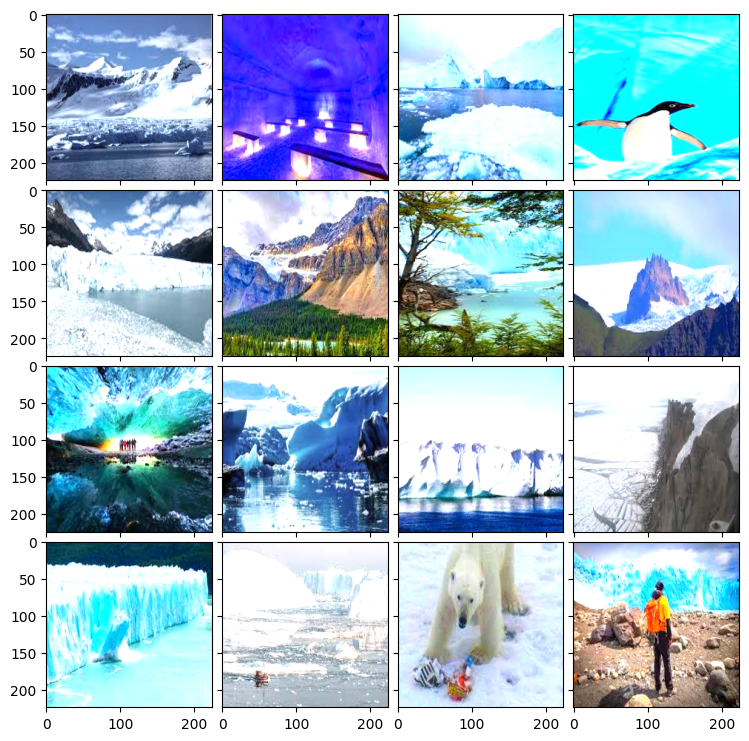

Showing images from category: Mountain


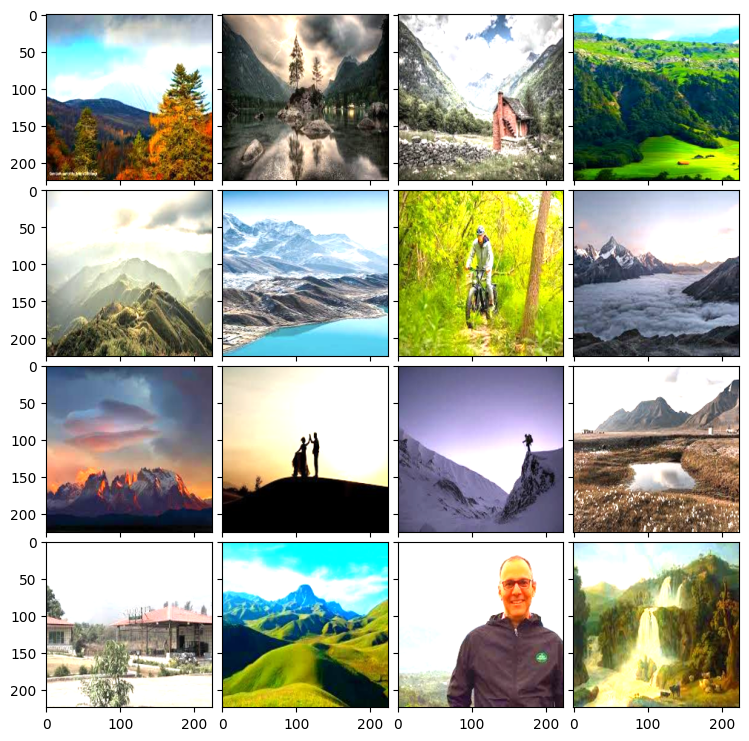

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

def show_image_grid(imgs, grid_size=(1, 1), resize_shape=None):
    fig = plt.figure(figsize=(9., 9.))
    grid = ImageGrid(fig, 111, # similar to subplot(111)
                     nrows_ncols=grid_size, # creates grid of axes
                     axes_pad=0.1, # pad between axes in inch.
                     )
    for ax, im in zip(grid, imgs):
        if resize_shape is not None:
            im = cv2.resize(im, resize_shape)
        ax.imshow(im)

train_dir = '/content/drive/MyDrive/Landscape Classification/Processed/Training'

resize_shape = (224, 224) # set the desired size of the images

for category in os.listdir(train_dir):
    category_dir = os.path.join(train_dir, category)
    if os.path.isdir(category_dir):
        print('Showing images from category:', category)
        images = []
        for image_filename in os.listdir(category_dir):
            image_path = os.path.join(category_dir, image_filename)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # convert to RGB
            if resize_shape is not None:
                image = cv2.resize(image, resize_shape)
            # apply contrast
            alpha = 1.5 # contrast control (1.0-3.0)
            beta = 0    # brightness control (0-100)
            image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
            images.append(image)
        show_image_grid(images, grid_size=(4, 4), resize_shape=resize_shape)
        plt.show()


**PCA**

Processing category: Coast
Processing category: Forest
Processing category: Glacier
Processing category: Mountain


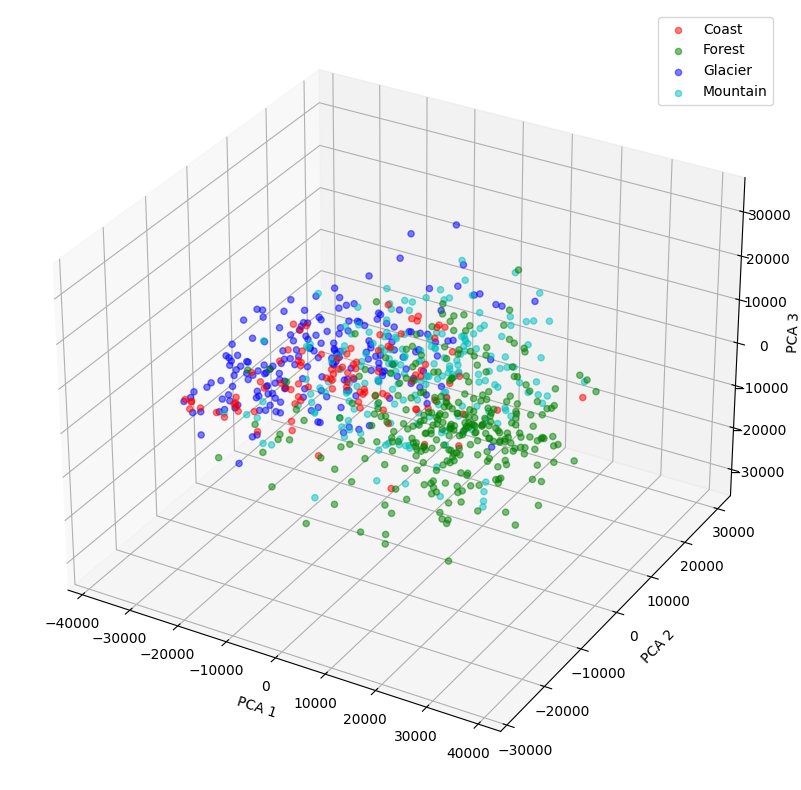

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

def show_pca_plot(images, labels):
    # convert images to 1D vectors
    images_flat = images.reshape((len(images), -1))

    # perform PCA to reduce dimensionality
    pca = PCA(n_components=3)
    images_pca = pca.fit_transform(images_flat)

    # plot PCA results
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']
    for i, label in enumerate(np.unique(labels)):
        idx = np.where(labels == label)[0]
        ax.scatter(images_pca[idx, 0], images_pca[idx, 1], images_pca[idx, 2], c=colors[i], label=label, alpha=0.5)
    ax.set_xlabel('PCA 1')
    ax.set_ylabel('PCA 2')
    ax.set_zlabel('PCA 3')
    ax.legend()
    plt.show()

def adjust_contrast(image, alpha):
    # apply contrast adjustment using alpha value
    new_image = cv2.convertScaleAbs(image, alpha=alpha, beta=0)
    return new_image

def adjust_sharpness(image, beta):
    # apply sharpness adjustment using beta value
    kernel = np.array([[-1,-1,-1], [-1,10,-1], [-1,-1,-1]]) * beta
    new_image = cv2.filter2D(image, -1, kernel)
    return new_image

def adjust_brightness(image, gamma):
    # apply brightness adjustment using gamma value
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
    new_image = cv2.LUT(image, table)
    return new_image

train_dir ='/content/drive/MyDrive/Landscape Classification/Processed/Training'
resize_shape = (224, 224)  # set the desired size of the images
alpha = 1.5  # set the contrast adjustment factor
beta = 0.5  # set the sharpness adjustment factor
gamma = 1.0  # set the brightness adjustment factor

images = []
labels = []
for i, category in enumerate(os.listdir(train_dir)):
    category_dir = os.path.join(train_dir, category)
    if os.path.isdir(category_dir):
        print('Processing category:', category)
        for image_filename in os.listdir(category_dir):
            image_path = os.path.join(category_dir, image_filename)
            image = cv2.imread(image_path)
            if resize_shape is not None:
                image = cv2.resize(image, resize_shape)
            if category == 'rose':
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # convert to RGB for 'rose' category

            # apply contrast, sharpness, and brightness adjustments
            image = adjust_contrast(image, alpha)
            image = adjust_sharpness(image, beta)
            image = adjust_brightness(image, gamma)

            images.append(image)
            labels.append(category)

images = np.array(images)
labels = np.array(labels)

show_pca_plot(images, labels)


**SVM**

In [ ]:
import cv2
import os
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from keras.applications.vgg16 import VGG16, preprocess_input

def preprocess_image(image, resize_shape, alpha, beta, gamma):
    # resize image
    image = cv2.resize(image, resize_shape)
    # convert to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # adjust contrast, sharpness, and brightness
    image = adjust_contrast(image, alpha)
    image = adjust_sharpness(image, beta)
    image = adjust_brightness(image, gamma)
    # preprocess image for VGG16
    image = preprocess_input(image)
    return image

def extract_features(images):
    # load VGG16 model
    model = VGG16(weights='imagenet', include_top=False)
    # extract features from images
    features = model.predict(images)
    # flatten the features
    features = features.reshape((len(features), -1))
    return features

train_dir ='/content/drive/MyDrive/Landscape Classification/Processed/Training'
resize_shape = (224, 224)  # set the desired size of the images
alpha = 1.5  # set the contrast adjustment factor
beta = 0.5  # set the sharpness adjustment factor
gamma = 1.0  # set the brightness adjustment factor

images = []
labels = []
for i, category in enumerate(os.listdir(train_dir)):
    category_dir = os.path.join(train_dir, category)
    if os.path.isdir(category_dir):
        print('Processing category:', category)
        for image_filename in os.listdir(category_dir):
            image_path = os.path.join(category_dir, image_filename)
            image = cv2.imread(image_path)
            image = preprocess_image(image, resize_shape, alpha, beta, gamma)
            images.append(image)
            labels.append(category)

images = np.array(images)
labels = np.array(labels)

# split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

# extract features from the training set
X_train_features = extract_features(X_train)

# train an SVM classifier on the training set
svm = SVC(kernel='linear', random_state=42)
svm.fit(X_train_features, y_train)

# extract features from the testing set
X_test_features = extract_features(X_test)

# evaluate the accuracy of the classifier on the testing set
y_pred = svm.predict(X_test_features)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

Processing category: Coast
Processing category: Forest
Processing category: Glacier
Processing category: Mountain
8/8 [==============================] - 6s 862ms/step
Accuracy: 0.7845528455284553


Classifier 2 -> logistic regression classifier

In [ ]:
import os
import cv2
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input

# Load the images and labels
train_dir = '/content/drive/MyDrive/Landscape Classification/Processed/Training'

resize_shape = (299, 299)  # set the desired size of the images
alpha = 1.5  # set the contrast adjustment factor
beta = 0.5  # set the sharpness adjustment factor
gamma = 1.0  # set the brightness adjustment factor

images = []
labels = []
for i, category in enumerate(os.listdir(train_dir)):
    category_dir = os.path.join(train_dir, category)
    if os.path.isdir(category_dir):
        print('Processing category:', category)
        for image_filename in os.listdir(category_dir):
            image_path = os.path.join(category_dir, image_filename)
            image = cv2.imread(image_path)
            if resize_shape is not None:
                image = cv2.resize(image, resize_shape)
            if category == 'rose':
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # convert to RGB for 'rose' category

            # apply contrast, sharpness, and brightness adjustments
            image = adjust_contrast(image, alpha)
            image = adjust_sharpness(image, beta)
            image = adjust_brightness(image, gamma)

            images.append(image)
            labels.append(category)

images = np.array(images)
labels = np.array(labels)

# Convert the labels to numerical values
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

# Extract features from the images using InceptionV3
feature_extractor = InceptionV3(weights='imagenet', include_top=False, pooling='max', input_shape=resize_shape+(3,))
X_train = preprocess_input(X_train)
X_test = preprocess_input(X_test)
X_train_features = feature_extractor.predict(X_train)
X_test_features = feature_extractor.predict(X_test)

# Train the logistic regression model
clf = LogisticRegression(random_state=42)
clf.fit(X_train_features, y_train)

# Make predictions on the testing set and compute accuracy
y_pred = clf.predict(X_test_features)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)


Processing category: Coast
Processing category: Forest
Processing category: Glacier
Processing category: Mountain
8/8 [==============================] - 6s 817ms/step
Accuracy: 0.7362204724409449


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Ensemble Classification

In [ ]:
import cv2
import os
import numpy as np
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# Constants
DATADIR = '/content/drive/MyDrive/Landscape Classification/Processed/Training'
CATEGORIES = ['Coast', 'Forest', 'Glacier', 'Mountain']
IMG_SIZE = (300, 300)

# Function to preprocess images
def preprocess_image(img_path):
    img_array = cv2.imread(img_path)
    img_array = cv2.resize(img_array, IMG_SIZE)
    img_array = cv2.GaussianBlur(img_array, (7, 7), 0)
    edges = cv2.Canny(img_array, 100, 200)
    return edges.flatten()

# Initialize variables
images = []
labels = []

# Load and preprocess images
for category in CATEGORIES:
    path = os.path.join(DATADIR, category)
    counter = 0
    for img in os.listdir(path):
        img_path = os.path.join(path, img)
        images.append(preprocess_image(img_path))
        labels.append(category)
        counter += 1
        if counter == 400:
            break

# Convert data to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Encode labels to numeric format
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

# Extract features using a decision tree
base_estimator = DecisionTreeClassifier(max_depth=1)
base_estimator.fit(X_train, y_train)
features_train = base_estimator.predict(X_train).reshape(-1, 1)
features_test = base_estimator.predict(X_test).reshape(-1, 1)

# Train AdaBoost classifier on extracted features
n_estimators = 200
learning_rate = 0.1
ada = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=n_estimators, learning_rate=learning_rate)
ada.fit(features_train, y_train)

# Make predictions on test data
y_pred = ada.predict(features_test)

# Decode labels back to original string format
y_test = label_encoder.inverse_transform(y_test)
y_pred = label_encoder.inverse_transform(y_pred)

# Evaluate model accuracy
acc = accuracy_score(y_test, y_pred)
print("Accuracy:", acc)


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Accuracy: 0.26071428571428573


**Confusion Matrix, ROC , AUC -> area under the curve**

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Accuracy: 0.8029411764705883
True Label: Forest


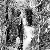


True Label: Coast


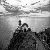


True Label: Glacier


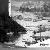


True Label: Glacier


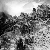


True Label: Forest


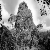


True Label: Forest


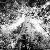


True Label: Forest


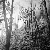


True Label: Coast


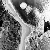


True Label: Mountain


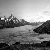


True Label: Mountain


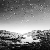


Accuracy: 0.8588235294117647
Confusion Matrix:
[[ 28   4   6   2]
 [  0 125   6   5]
 [  3   6  73   5]
 [  2   4   5  66]]


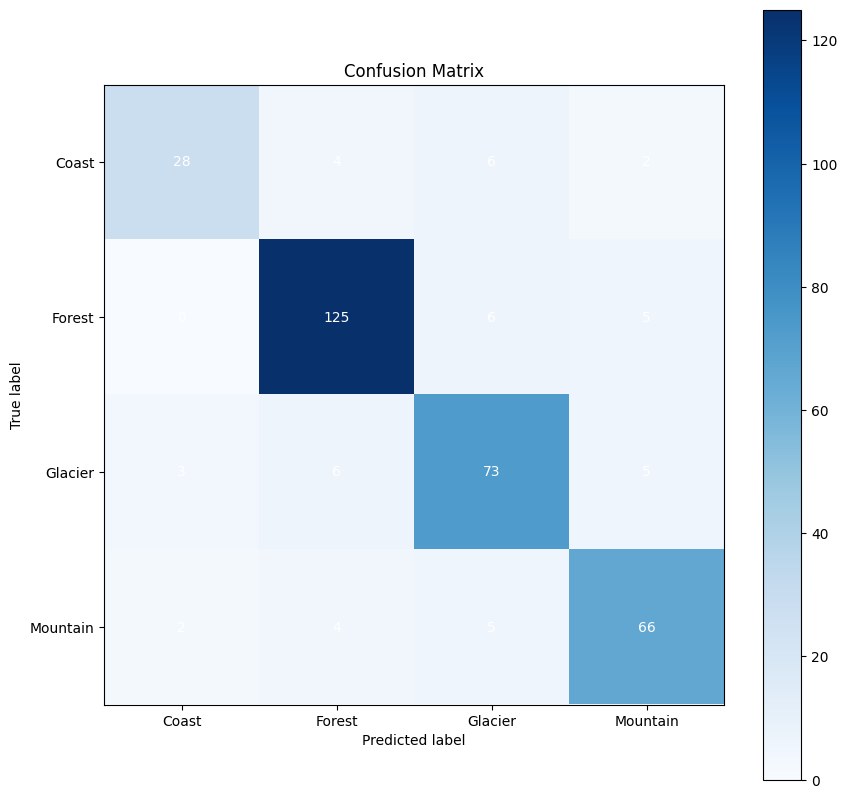

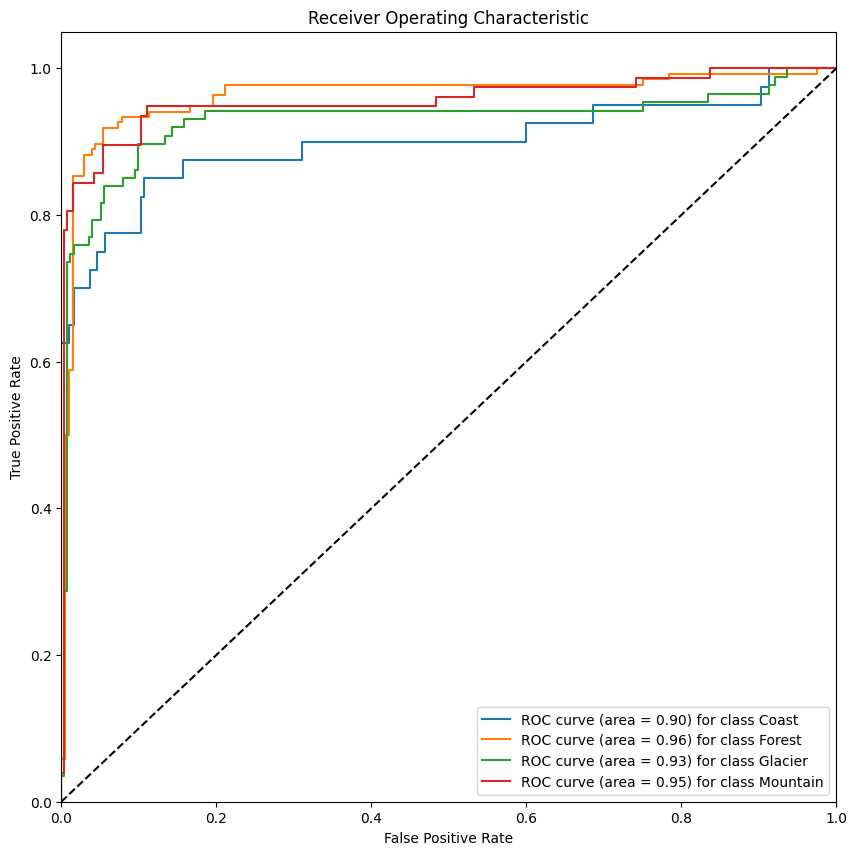

Overall AUC: 0.9361419745050756


In [ ]:
import os
import cv2
import numpy as np
from skimage import exposure
from google.colab.patches import cv2_imshow
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix

# Define the path to the image dataset
path = '/content/drive/MyDrive/Landscape Classification/Processed/Training'

# Create a list of image file paths
for root, dirs, files in os.walk(path):

    counter = 0

    for file in files:

        counter += 1

        if file.endswith('.jpeg'):
            image_paths.append(os.path.join(root, file))

        if counter == 800:
           break
# Define the grayscale, normalization, and standardization functions
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

def normalize(image):
    return exposure.equalize_hist(image, nbins=256, mask=None)

def standardize(image):
    mean = np.mean(image)
    std = np.std(image)
    return (image - mean) / std

# Define the feature extraction function
def extract_features(image):
    # Apply grayscale, normalization, and standardization
    grayscale_image = grayscale(image)
    normalized_image = normalize(grayscale_image)
    standardized_image = standardize(normalized_image)

    # Scale the output to the expected range of [0, 255]
    scaled_image = (standardized_image - np.min(standardized_image)) * 255 / (np.max(standardized_image) - np.min(standardized_image))

    # Resize the image to 50x50
    resized_image = cv2.resize(scaled_image, (50, 50))

    # Flatten the image into a 1D array
    flattened_image = resized_image.flatten()

    return flattened_image

# Extract features from the dataset
X = []
y = []
for image_path in image_paths:
    # Load the image
    image = cv2.imread(image_path)

    # Extract the features and label
    features = extract_features(image)
    label = os.path.basename(os.path.dirname(image_path))

    # Add the features and label to the lists
    X.append(features)
    y.append(label)

# Convert the lists to numpy arrays
X = np.array(X)
y = np.array(y)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the SVM classifier
svm_clf = SVC(kernel='rbf', C=1, random_state=42)

# Define the random forest classifier
rf_clf = RandomForestClassifier(n_estimators=10, random_state=42)

# Define the bagging classifier
bagging_clf = BaggingClassifier(base_estimator=svm_clf, n_estimators=10, random_state=42)

# Train the bagging classifier on the training set
bagging_clf.fit(X_train, y_train)

# Evaluate the model on the testing set
y_pred = bagging_clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)



# Show a sample of images with their predictions
sample_size = 10
sample_indices = np.random.choice(len(X_test), sample_size, replace=False)

for i in sample_indices:
    # Get the image and its true label
    image = X_test[i].reshape(50, 50)
    true_label = y_test[i]

    # Get the predicted label from the model
    pred_label = clf.predict(X_test[i].reshape(1, -1))[0]

    # Show the image with its true label and predicted label
    print('True Label:', true_label)
    cv2_imshow(image.astype(np.uint8))
    print()  # Print a blank line for spacing


    #confusion matrix
from sklearn.metrics import confusion_matrix

# Evaluate the model on the testing set
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print the confusion matrix
print('Confusion Matrix:')
print(cm)


#confusion matrix with image
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Get the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Define the labels for the plot
labels = np.unique(y)

# Plot the confusion matrix as a heatmap
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(cm, cmap='Blues')

# Set the axis labels
ax.set_xticks(np.arange(len(labels)))
ax.set_yticks(np.arange(len(labels)))
ax.set_xticklabels(labels)
ax.set_yticklabels(labels)

# Set the colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# Set the plot title and axis labels
ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted label')
ax.set_ylabel('True label')

# Loop over the data and add the text labels
for i in range(len(labels)):
    for j in range(len(labels)):
        text = ax.text(j, i, cm[i, j], ha='center', va='center', color='w')

# Show the plot
plt.show()

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Calculate the probabilities for the test set
y_prob = clf.predict_proba(X_test)

# Calculate the ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(labels)):
    fpr[i], tpr[i], _ = roc_curve(y_test == labels[i], y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curve and show the AUC
plt.figure(figsize=(10, 10))
for i in range(len(labels)):
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for class %s' % (roc_auc[i], labels[i]))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Show the overall AUC
print('Overall AUC:', np.mean(list(roc_auc.values())))

**Decision tree**

In [ ]:
import cv2
import os
import numpy as np
from PIL import Image, ImageEnhance
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

DATADIR = '/content/drive/MyDrive/Landscape Classification/Processed/Training'
CATEGORIES = ['Coast', 'Forest', 'Glacier', 'Mountain']
IMG_SIZE = (300, 300)  # set desired image size

# Initialize variables
images = []
labels = []

# Extract features from images
for category in CATEGORIES:
    path = os.path.join(DATADIR, category)
    counter = 0
    for img in os.listdir(path):
        img_path = os.path.join(path, img)
        img_array = cv2.imread(img_path)
        img_array = cv2.resize(img_array, IMG_SIZE)
        img_array = cv2.medianBlur(img_array, 3)
        pil_image = Image.fromarray(img_array)
        enhancer = ImageEnhance.Contrast(pil_image)
        contrast_image = enhancer.enhance(1.5)
        img_array = cv2.cvtColor(np.array(contrast_image), cv2.COLOR_RGB2BGR)
        edges = cv2.Canny(img_array, 100, 200)
        features = edges.flatten()  # flatten the image array into a 1D feature vector
        images.append(features)
        labels.append(category)

        counter += 1
        if counter == 1300:
          break

# Encode labels as integers
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Train a decision tree classifier
clf = DecisionTreeClassifier()
clf.fit(images, labels)

# Make predictions on the training set
train_pred = clf.predict(images)
train_acc = accuracy_score(labels, train_pred)
print("Training accuracy:", train_acc)

Training accuracy: 1.0


 Ensemble Classification of decission tree

In [ ]:
import cv2
import os
import numpy as np
from PIL import Image, ImageEnhance
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

DATADIR = '/content/drive/MyDrive/Landscape Classification/Processed/Training'
CATEGORIES = ['Coast', 'Forest', 'Glacier', 'Mountain']
IMG_SIZE = (300, 300)  # set desired image size

# Initialize variables
images = []
labels = []

# Extract features from images
for category in CATEGORIES:
    path = os.path.join(DATADIR, category)
    counter = 0
    for img in os.listdir(path):
        img_path = os.path.join(path, img)
        img_array = cv2.imread(img_path)
        img_array = cv2.resize(img_array, IMG_SIZE)
        img_array = cv2.medianBlur(img_array, 3)
        pil_image = Image.fromarray(img_array)
        enhancer = ImageEnhance.Contrast(pil_image)
        contrast_image = enhancer.enhance(1.5)
        img_array = cv2.cvtColor(np.array(contrast_image), cv2.COLOR_RGB2BGR)
        edges = cv2.Canny(img_array, 100, 200)
        features = edges.flatten()  # flatten the image array into a 1D feature vector
        images.append(features)
        labels.append(category)

        counter += 1
        if counter == 1300:
          break

# Encode labels as integers
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Initialize decision tree classifiers
clf1 = DecisionTreeClassifier()
clf2 = DecisionTreeClassifier()
clf3 = DecisionTreeClassifier()

# Initialize ensemble classifier
ensemble_clf = VotingClassifier(estimators=[('dt1', clf1), ('dt2', clf2), ('dt3', clf3)], voting='hard')

# Fit the ensemble classifier
ensemble_clf.fit(images, labels)

# Make predictions on the training set
train_pred = ensemble_clf.predict(images)
train_acc = accuracy_score(labels, train_pred)
print("Training accuracy:", train_acc)

Training accuracy: 1.0


Confusion Matrix, ROC , AUC

Testing accuracy: 0.3237822349570201
Confusion matrix:
 [[28  9 29 31]
 [14 27 20 30]
 [25  7 28 19]
 [23  6 23 30]]


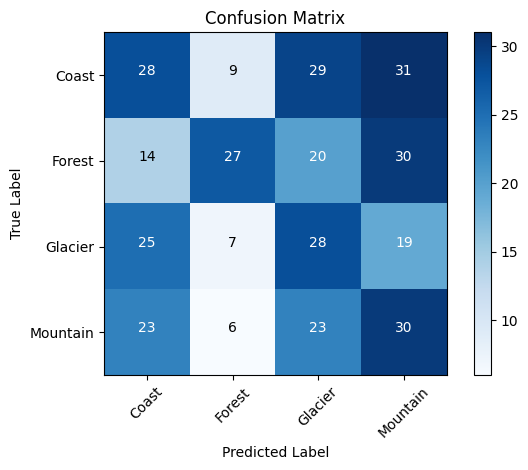

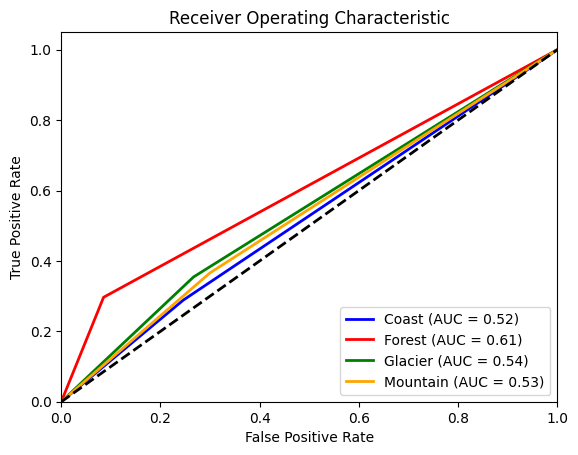

In [ ]:
import cv2
import os
import numpy as np
from PIL import Image, ImageEnhance
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import itertools

DATADIR = '/content/drive/MyDrive/Landscape Classification'
TRAIN_DIR = os.path.join(DATADIR, 'Training Data')
TEST_DIR = os.path.join(DATADIR, 'Testing Data')
CATEGORIES = ['Coast', 'Forest', 'Glacier', 'Mountain']
IMG_SIZE = (300, 300)

# Initialize variables
train_images = []
train_labels = []
test_images = []
test_labels = []

# Load and preprocess training data
for category in CATEGORIES:
    counter = 0
    path = os.path.join(TRAIN_DIR, category)
    for img in os.listdir(path):
        img_path = os.path.join(path, img)
        img_array = cv2.imread(img_path)
        img_array = cv2.resize(img_array, IMG_SIZE)
        img_array = cv2.medianBlur(img_array, 3)
        pil_image = Image.fromarray(img_array)
        enhancer = ImageEnhance.Contrast(pil_image)
        contrast_image = enhancer.enhance(1.5)
        img_array = cv2.cvtColor(np.array(contrast_image), cv2.COLOR_RGB2BGR)
        edges = cv2.Canny(img_array, 100, 200)
        features = edges.flatten()
        train_images.append(features)
        train_labels.append(category)

        counter += 1
        if counter == 1500:
          break

# Encode labels as integers
label_encoder = LabelEncoder()
train_labels = label_encoder.fit_transform(train_labels)

# Load and preprocess testing data
for category in CATEGORIES:
    counter = 0
    path = os.path.join(TEST_DIR, category)
    for img in os.listdir(path):
        img_path = os.path.join(path, img)
        img_array = cv2.imread(img_path)
        img_array = cv2.resize(img_array, IMG_SIZE)
        img_array = cv2.medianBlur(img_array, 3)
        pil_image = Image.fromarray(img_array)
        enhancer = ImageEnhance.Contrast(pil_image)
        contrast_image = enhancer.enhance(1.5)
        img_array = cv2.cvtColor(np.array(contrast_image), cv2.COLOR_RGB2BGR)
        edges = cv2.Canny(img_array, 100, 200)
        features = edges.flatten()
        test_images.append(features)
        test_labels.append(category)

        counter += 1
        if counter == 1000:
          break

# Encode labels as integers
test_labels = label_encoder.transform(test_labels)

# Train a decision tree classifier
clf = DecisionTreeClassifier()
clf.fit(train_images, train_labels)

# Make predictions on the testing set
test_pred = clf.predict(test_images)

# Calculate accuracy and confusion matrix
test_acc = accuracy_score(test_labels, test_pred)
print("Testing accuracy:", test_acc)

cm = confusion_matrix(test_labels, test_pred)
print("Confusion matrix:\n", cm)

# == show confusion matrix ==
# Show the confusion matrix
plt.imshow(cm, cmap='Blues')
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(CATEGORIES))
plt.xticks(tick_marks, CATEGORIES, rotation=45)
plt.yticks(tick_marks, CATEGORIES)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add the values to the heatmap
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], '.0f'),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()
# == show confusion matrix ==
# Calculate ROC curve and AUC
y_score = clf.predict_proba(test_images)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(CATEGORIES)):
    fpr[i], tpr[i], _ = roc_curve(test_labels, y_score[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure()
lw = 2
colors = ['blue', 'red', 'green', 'orange', 'purple']
for i, color in zip(range(len(CATEGORIES)), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='{0} (AUC = {1:0.2f})'
             ''.format(CATEGORIES[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], color='black', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

Deep Learning


Found 1526 images belonging to 4 classes.
Found 948 images belonging to 4 classes.
Epoch 1/10
47/47 [==============================] - 177s 4s/step - loss: 1.1533 - accuracy: 0.4632 - val_loss: 1.0952 - val_accuracy: 0.5334
Epoch 2/10
47/47 [==============================] - 10s 211ms/step - loss: 0.9481 - accuracy: 0.6118 - val_loss: 1.0176 - val_accuracy: 0.5851
Epoch 3/10
47/47 [==============================] - 10s 218ms/step - loss: 0.8898 - accuracy: 0.6359 - val_loss: 0.9792 - val_accuracy: 0.5894
Epoch 4/10
47/47 [==============================] - 11s 236ms/step - loss: 0.8712 - accuracy: 0.6399 - val_loss: 0.9307 - val_accuracy: 0.6153
Epoch 5/10
47/47 [==============================] - 11s 236ms/step - loss: 0.7993 - accuracy: 0.6827 - val_loss: 0.9514 - val_accuracy: 0.6034
Epoch 6/10
47/47 [==============================] - 10s 214ms/step - loss: 0.7478 - accuracy: 0.7008 - val_loss: 0.9697 - val_accuracy: 0.6228
Epoch 7/10
47/47 [==============================] - 12s 252ms

<ipython-input-18-7ba3c87fbb11>:33: RuntimeWarning: invalid value encountered in divide
  heatmap /= np.max(heatmap)
<ipython-input-18-7ba3c87fbb11>:108: RuntimeWarning: invalid value encountered in cast
  heatmap_rescaled = np.uint8(255 * heatmap_resized)


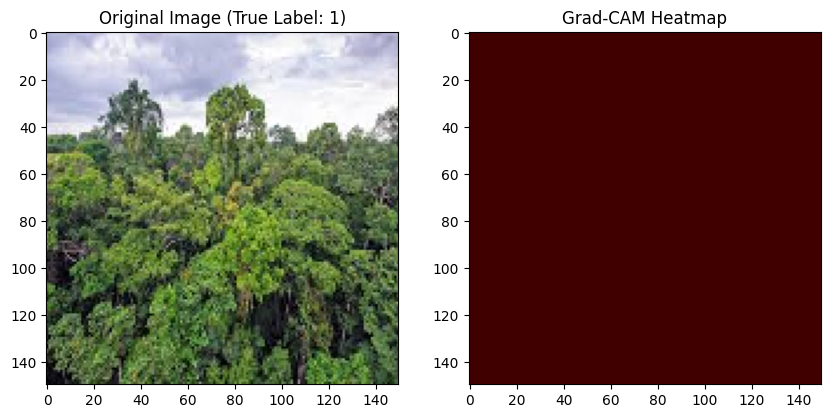

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models
import os
import cv2
import matplotlib.pyplot as plt

# Data directories
TRAIN_DIR = '/content/drive/MyDrive/Landscape Classification/Training Data'
VAL_DIR = '/content/drive/MyDrive/Landscape Classification/Validation Data'
TEST_DIR = '/content/drive/MyDrive/Landscape Classification/Testing Data'

# Image size
image_size = (150, 150)

# Function to generate Grad-CAM visualization
def generate_grad_cam(model, image, class_index, layer_index):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.layers[layer_index].output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.array([image]))
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_output)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0]
    heatmap = tf.reduce_mean(tf.multiply(conv_output, pooled_grads), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Load and preprocess the data
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=image_size,
    batch_size=32,
    class_mode='categorical'
)

val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_directory(
    VAL_DIR,
    target_size=image_size,
    batch_size=32,
    class_mode='categorical'
)

# Define the model
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dense(4, activation='softmax')  # Adjust num_classes based on your dataset
])

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // 32,
    epochs=10,
    validation_data=val_generator,
    validation_steps=val_generator.samples // 32
)

# Evaluate the model
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=image_size,
    batch_size=32,
    class_mode='categorical'
)

test_loss, test_accuracy = model.evaluate(test_generator)

print("Test Accuracy:", test_accuracy)

# Choose an image from the test set
test_image, test_label = next(test_generator)

# Generate Grad-CAM visualization for the chosen image
class_index = np.argmax(test_label[0])  # Use the true label
layer_index = 3  # Layer index for the fourth convolutional layer
heatmap = generate_grad_cam(model, test_image[0], class_index, layer_index)

# Resize the heatmap to match the original image size
heatmap_resized = cv2.resize(heatmap, (test_image.shape[2], test_image.shape[1]))

# Superimpose the heatmap on the original image
heatmap_rescaled = np.uint8(255 * heatmap_resized)
heatmap_rescaled = cv2.applyColorMap(heatmap_rescaled, cv2.COLORMAP_JET)  # Apply colormap for better visualization
superimposed_img = cv2.addWeighted(test_image[0].astype('uint8'), 0.5, heatmap_rescaled.astype('uint8'), 0.5, 0)

# Display the original image and the superimposed image with Grad-CAM heatmap
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(test_image[0])
plt.title("Original Image (True Label: {})".format(class_index))
plt.subplot(1, 2, 2)
plt.imshow(superimposed_img)
plt.title("Grad-CAM Heatmap")
plt.show()

ROC

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SVM Accuracy: 0.80
Logistic Regression Accuracy: 0.79


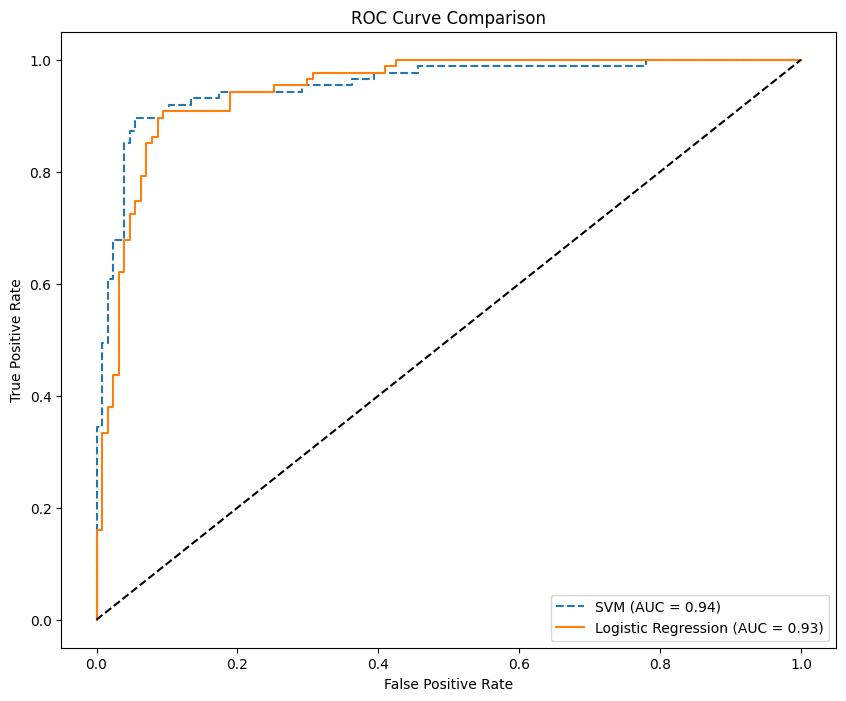

SVM AUC: 0.94
Logistic Regression AUC: 0.93


In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

# Define classifiers
svm = SVC(probability=True)
logreg = LogisticRegression()

# Train classifiers on the training set
svm.fit(X_train_features, y_train)
logreg.fit(X_train_features, y_train)

# Make predictions on the testing set and compute accuracy
svm_y_pred = svm.predict(X_test_features)
logreg_y_pred = logreg.predict(X_test_features)

svm_accuracy = accuracy_score(y_test, svm_y_pred)
logreg_accuracy = accuracy_score(y_test, logreg_y_pred)

print(f"SVM Accuracy: {svm_accuracy:.2f}")
print(f"Logistic Regression Accuracy: {logreg_accuracy:.2f}")

# Calculate predicted probabilities for each class
svm_y_pred_prob = svm.predict_proba(X_test_features)
logreg_y_pred_prob = logreg.predict_proba(X_test_features)

# Compute ROC curve and AUC for each class for SVM
svm_roc_auc = roc_auc_score(y_test, svm_y_pred_prob, multi_class='ovr', average='macro')
svm_fpr, svm_tpr, _ = roc_curve(y_test, svm_y_pred_prob[:,1], pos_label=1)

# Compute ROC curve and AUC for each class for Logistic Regression
logreg_roc_auc = roc_auc_score(y_test, logreg_y_pred_prob, multi_class='ovr', average='macro')
logreg_fpr, logreg_tpr, _ = roc_curve(y_test, logreg_y_pred_prob[:,1], pos_label=1)

# Plot ROC curve for each class
plt.figure(figsize=(10,8))

plt.plot(svm_fpr, svm_tpr, label=f"SVM (AUC = {svm_roc_auc:.2f})", linestyle='--')
plt.plot(logreg_fpr, logreg_tpr, label=f"Logistic Regression (AUC = {logreg_roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison")
plt.legend()
plt.show()

# Print AUC scores for each class
print(f"SVM AUC: {svm_roc_auc:.2f}")
print(f"Logistic Regression AUC: {logreg_roc_auc:.2f}")

AUC

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SVM Accuracy: 0.80
Logistic Regression Accuracy: 0.79


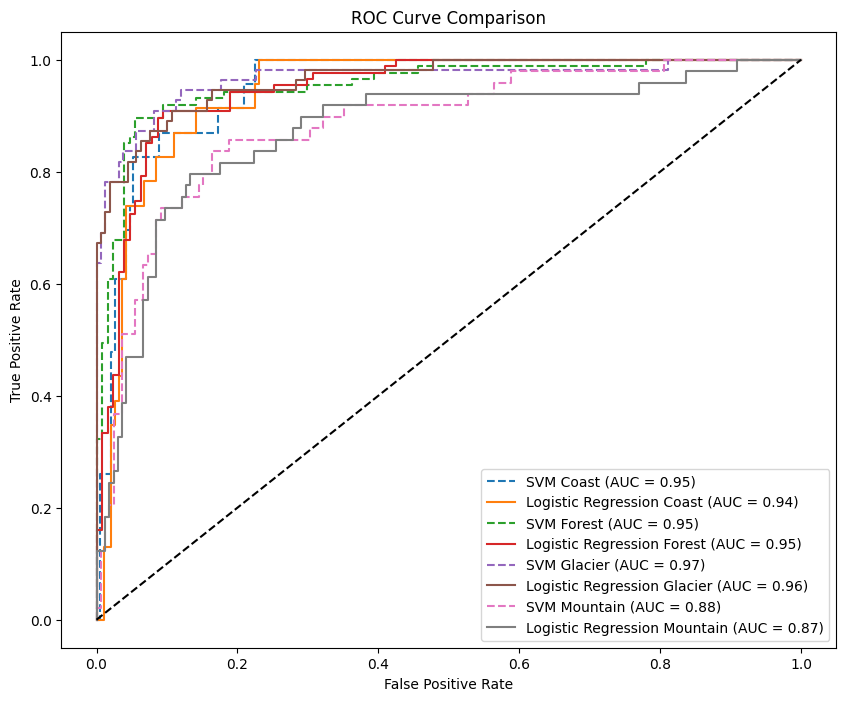

SVM Coast AUC: 0.95
Logistic Regression Coast AUC: 0.94
SVM Forest AUC: 0.95
Logistic Regression Forest AUC: 0.95
SVM Glacier AUC: 0.97
Logistic Regression Glacier AUC: 0.96
SVM Mountain AUC: 0.88
Logistic Regression Mountain AUC: 0.87


In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

# Define classifiers
svm = SVC(probability=True)
logreg = LogisticRegression()

# Train classifiers on the training set
svm.fit(X_train_features, y_train)
logreg.fit(X_train_features, y_train)

# Make predictions on the testing set and compute accuracy
svm_y_pred = svm.predict(X_test_features)
logreg_y_pred = logreg.predict(X_test_features)

svm_accuracy = accuracy_score(y_test, svm_y_pred)
logreg_accuracy = accuracy_score(y_test, logreg_y_pred)

print(f"SVM Accuracy: {svm_accuracy:.2f}")
print(f"Logistic Regression Accuracy: {logreg_accuracy:.2f}")

# Calculate predicted probabilities for each class
svm_y_pred_prob = svm.predict_proba(X_test_features)
logreg_y_pred_prob = logreg.predict_proba(X_test_features)

# Compute ROC curve and AUC for each class for SVM
svm_fpr = dict()
svm_tpr = dict()
svm_roc_auc = dict()

for i in range(len(label_encoder.classes_)):
    svm_fpr[i], svm_tpr[i], _ = roc_curve(y_test, svm_y_pred_prob[:, i], pos_label=i)
    svm_roc_auc[i] = auc(svm_fpr[i], svm_tpr[i])

# Compute ROC curve and AUC for each class for Logistic Regression
logreg_fpr = dict()
logreg_tpr = dict()
logreg_roc_auc = dict()

for i in range(len(label_encoder.classes_)):
    logreg_fpr[i], logreg_tpr[i], _ = roc_curve(y_test, logreg_y_pred_prob[:, i], pos_label=i)
    logreg_roc_auc[i] = auc(logreg_fpr[i], logreg_tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10,8))

for i in range(len(label_encoder.classes_)):
    plt.plot(svm_fpr[i], svm_tpr[i], label=f"SVM {label_encoder.classes_[i]} (AUC = {svm_roc_auc[i]:.2f})", linestyle='--')
    plt.plot(logreg_fpr[i], logreg_tpr[i], label=f"Logistic Regression {label_encoder.classes_[i]} (AUC = {logreg_roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison")
plt.legend()
plt.show()

# Print AUC scores for each class
for i in range(len(label_encoder.classes_)):
    print(f"SVM {label_encoder.classes_[i]} AUC: {svm_roc_auc[i]:.2f}")
    print(f"Logistic Regression {label_encoder.classes_[i]} AUC: {logreg_roc_auc[i]:.2f}")


cm

In [ ]:
from sklearn.metrics import confusion_matrix

# Make predictions on the testing set
y_pred = clf.predict(X_test_features)

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print the confusion matrix
print(cm)


[[11  2  3  7]
 [ 0 78  0  9]
 [ 7  0 43  5]
 [ 0 10  2 37]]


In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix

# Initialize the stacking classifier with the SVM and logistic regression models
estimators = [('svm', svm), ('clf', clf)]
stacking_classifier = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())

# Train the stacking classifier on the training set
stacking_classifier.fit(X_train_features, y_train)

# Make predictions on the testing set
y_pred = stacking_classifier.predict(X_test_features)

# Compute accuracy and confusion matrix
accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)

print('Accuracy:', accuracy)
print('Confusion matrix:\n', cm)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Accuracy: 0.8177570093457944
Confusion matrix:
 [[14  1  4  4]
 [ 0 79  0  8]
 [ 6  0 44  5]
 [ 1  7  3 38]]
